# *CGH optimization*
**Author:** Gawoon Ban, Dong-Ha Shin | **Last Updated:** 2025-03-20

Comparing `CGH` optimization techniques, including `Gerchberg-Saxton` (GS), `Stochastic Gradient Descent` (SGD) and `Adaptive Moment Estimation` (ADAM).

In this code, We assume `complex SLM` that can control both amplitude and phase.

In [1]:
cd ../..

c:\Users\PC\Desktop\pado


---

## 🌊 **Step 1: Import Pado**
First, you should import `Pado`. Make sure to install all the dependency

In [2]:
import pado
from pado.math import cm, nm, um

import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

## ⚙️ **Step 2: Default value setting**
Sets the values of the variables used in the code. You can change the values in this part to suit your situation.

In [3]:
R = 1080  # number of rows
C = 1920  # number of columns
pitch = 6.4*um  # physical size of each pixel in [m]
wvl = [660*nm, 521*nm, 445*nm]  # wavelength of the light in [m]
dim = (1, 3, R, C)  # dimension of the light [batch, channel, row, column]
device = 'cuda' if torch.cuda.is_available() else 'cpu'
prop = pado.propagator.Propagator('ASM')

dist = 15 * cm  # distance of the propagation in [m]

##  **🤖 Step 3: Implementation of CGH optimization algorithms**
Create an algorithm for `CGH optimization`. `Mode` variable is used to proceed with optimization in each way of `GS`, `SGD`, and `ADAM`.    
Performance is evaluated by `psnr`.

In [4]:
class IterativeCGH:
    def __init__(self, mode):
        """Create CGH optimization instance
        
        Args:
            mode (str): Algorithm type - one of "GS", "SGD", or "ADAM"
        """
        self.mode = mode # You can use this variable to use the algorithm you want.
        
    def optimize(self, light, target, z, n_iter=100, prop_model='ASM'):
        """Optimize light field phase to match target intensity pattern
        
        Args:
            light (Light): Input light field
            target (Light): Target intensity pattern  
            z (float): Propagation distance in meters
            n_iter (int): Number of iterations (default: 100)
            prop_model (str): Propagation model (default: 'ASM')
        """
        if self.mode == "GS":
            return self.gerchberg_saxton(light, target, z, n_iter, prop_model)
        elif self.mode == "SGD":
            return self.stochastic_gradient_descent(light, target, z, n_iter, prop_model)
        elif self.mode == "ADAM":
            return self.adaptive_moment_estimation(light, target, z, n_iter, prop_model)
            
    def gerchberg_saxton(self, init_light, target_light, z, n_iter=100, prop_model='ASM'):
        """Implementation of Gerchberg-Saxton phase retrieval algorithm"""
        slm_field = init_light.clone()
        prop = pado.propagator.Propagator(prop_model)
        
        print("Using gerchberg saxton (GS) algorithm")
        for i in range(n_iter):
            if i % 10 == 0:
                psnr = pado.math.calculate_psnr(prop.forward(slm_field, -z).get_intensity(), target_light.get_intensity())
                print(f"Iteration {i}, PSNR: {psnr:.2f}")

            slm_field.set_amplitude_ones()
            recon_field = prop.forward(slm_field, -z)
            recon_field.set_amplitude(target_light.get_amplitude())
            slm_field = prop.forward(recon_field, z)
        print("===========================================================")
        return slm_field

    def stochastic_gradient_descent(self, init_light, target_light, z, n_iter=100, prop_model='ASM', lr=500000):
        """Implementation of SGD-based phase optimization"""
        slm_field = init_light.clone()
        prop = pado.propagator.Propagator(prop_model)
        target_amp = target_light.get_amplitude().detach()

        optimizer = optim.SGD([slm_field.field.requires_grad_()], lr=lr)
        loss_fn = nn.MSELoss()
        print("Using stochastic gradient descent (SGD) algorithm")
        for i in range(n_iter):
            optimizer.zero_grad()
            recon_field = prop.forward(slm_field, -z)
            recon_amp = recon_field.get_amplitude()
            loss = loss_fn(recon_amp, target_amp)
            loss.backward()
            optimizer.step()

            if i % 10 == 0:
                psnr = pado.math.calculate_psnr(prop.forward(slm_field, -z).get_intensity(), target_light.get_intensity())
                print(f"Iteration {i}, PSNR: {psnr:.2f}")
        print("===========================================================")
        return slm_field

    def adaptive_moment_estimation(self, init_light, target_light, z, n_iter=100, prop_model='ASM', lr=1e-1):
        """Implementation of Adam optimization"""
        slm_field = init_light.clone()
        prop = pado.propagator.Propagator(prop_model)
        target_amp = target_light.get_amplitude().detach()

        optimizer = optim.Adam([slm_field.field.requires_grad_()], lr=lr)
        loss_fn = nn.MSELoss()
        print("Using adaptive moment estimation (ADAM) algorithm")
        for i in range(n_iter):
            optimizer.zero_grad()
            recon_field = prop.forward(slm_field, -z)
            recon_amp = recon_field.get_amplitude()
            loss = loss_fn(recon_amp, target_amp)
            loss.backward()
            optimizer.step()

            if i % 10 == 0:
                psnr = pado.math.calculate_psnr(prop.forward(slm_field, -z).get_intensity(), target_light.get_intensity())
                print(f"Iteration {i}, PSNR: {psnr:.2f}")
        print("===========================================================")
        return slm_field

##  **🖼️ Step 4: Build objectplane**
Load an example image for CGH optimization.    
This image becomes the ground truth we want to rebuild.

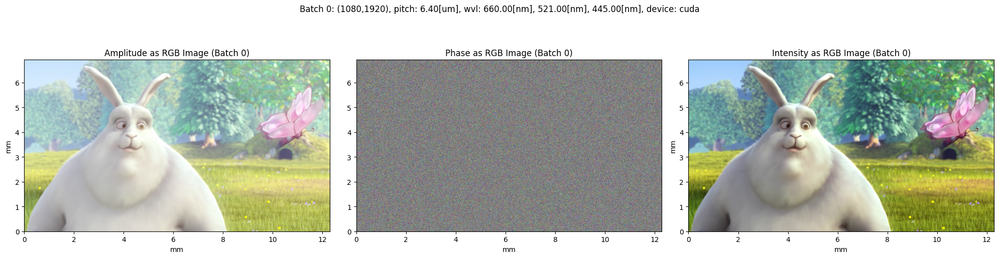

In [5]:
object_plane = pado.light.Light(dim, pitch, wvl, device=device)
object_plane.load_image(r'example\asset\bunny.PNG', random_phase=True)
object_plane.visualize_image()

##  **🔙 Step 5: Reconstruct original image by simple forward**
Simply `reconstruction` the original image in the manner used in Step 5 of 2.2. 

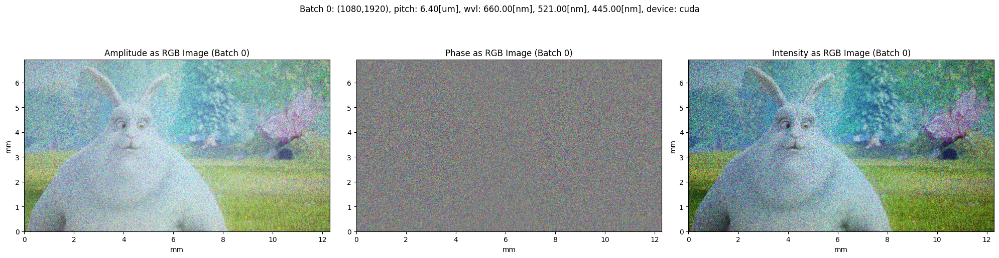

In [6]:
# Original image reconstruction
SLM_plane = prop.forward(object_plane, dist)
original_reconstruction = prop.forward(SLM_plane, -dist)

original_reconstruction.adjust_amplitude_to_other_light(object_plane) # Adjusting the amplitude compared to the original light
original_reconstruction.visualize_image()

##  **🤖 Step 6: GS algorithm for phase retrieval**
Proceed CGH optimization using `GS` algorithm.

In [7]:
GS_optimizer = IterativeCGH('GS')
GS_Optimized = GS_optimizer.optimize(SLM_plane, object_plane, dist, n_iter=50)

Using gerchberg saxton (GS) algorithm
Iteration 0, PSNR: 7.72
Iteration 10, PSNR: 13.41
Iteration 20, PSNR: 14.08
Iteration 30, PSNR: 14.40
Iteration 40, PSNR: 14.60


##  **🤖 Step 7: SGD algorithm for phase retrieval**
Proceed CGH optimization using `SGD` algorithm.

In [8]:
SGD_optimizer = IterativeCGH('SGD')
SGD_Optimized = SGD_optimizer.optimize(SLM_plane, object_plane, dist, n_iter=50)

Using stochastic gradient descent (SGD) algorithm
Iteration 0, PSNR: 8.27
Iteration 10, PSNR: 12.09
Iteration 20, PSNR: 13.50
Iteration 30, PSNR: 14.47
Iteration 40, PSNR: 15.24


##  **🤖 Step 8: ADAM algorithm for phase retrieval**
Proceed CGH optimization using `ADAM` algorithm.

In [9]:
ADAM_optimizer = IterativeCGH('ADAM')
ADAM_Optimized = ADAM_optimizer.optimize(SLM_plane, object_plane, dist, n_iter=50)

Using adaptive moment estimation (ADAM) algorithm
Iteration 0, PSNR: 8.89
Iteration 10, PSNR: 10.57
Iteration 20, PSNR: 15.70
Iteration 30, PSNR: 16.79
Iteration 40, PSNR: 18.70


##  **🎖️ Step 9: Compare optimization result**
Compare the optimization results with each algorithm, which is evaluated through the `psnr` score.

 Original Reconstruction PSNR : 3.192544937133789 dB


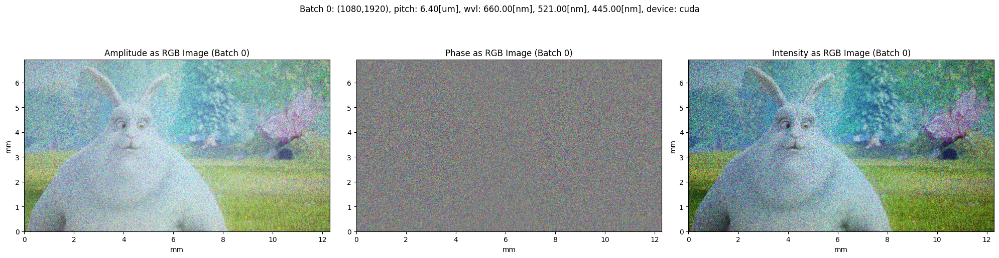

 GS Reconstruction PSNR : 14.742057800292969 dB


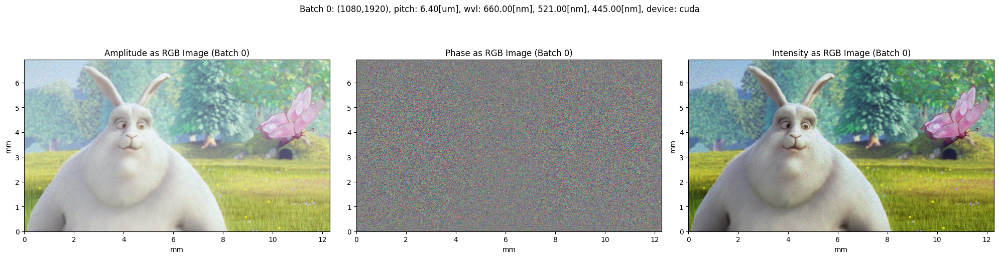

 SGD Reconstruction PSNR : 15.806344985961914 dB


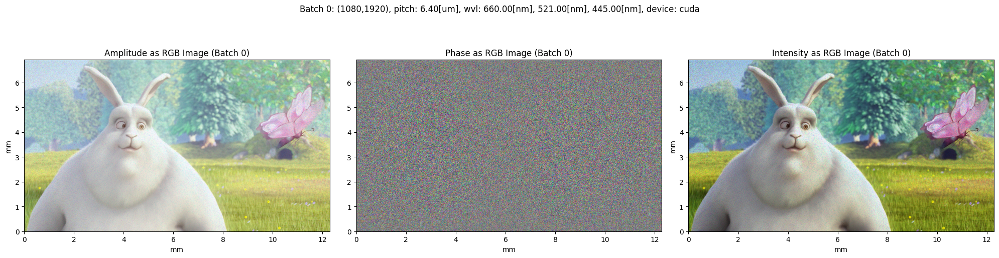

 ADAM Reconstruction PSNR : 19.326387405395508 dB


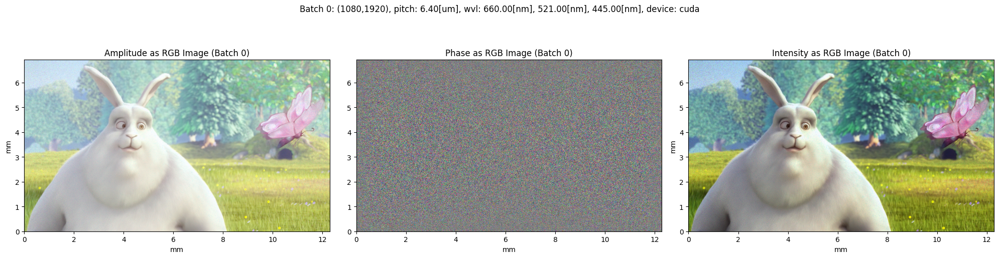

In [10]:
# reconstruction of the optimized image
GS_reconstruction = prop.forward(GS_Optimized, -dist)
SGD_reconstruction = prop.forward(SGD_Optimized, -dist)
ADAM_reconstruction = prop.forward(ADAM_Optimized, -dist)

# PSNR calculation and visualization
print(" Original Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane.get_intensity(), original_reconstruction.get_intensity())))
original_reconstruction.visualize_image()

print(" GS Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane.get_intensity(), GS_reconstruction.get_intensity())))
GS_reconstruction.visualize_image()

print(" SGD Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane.get_intensity(), SGD_reconstruction.get_intensity())))
SGD_reconstruction.visualize_image()

print(" ADAM Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane.get_intensity(), ADAM_reconstruction.get_intensity())))
ADAM_reconstruction.visualize_image()

---

## **🔁 Option: Re-play the optimizing SLM plane with No random phase**

We repeat the process `without random phase`.   

- In CGH, `random phase` adds a random pattern to the light’s phase to diffuse image details across the frequency space. This uses the hologram’s capacity better, improving viewing angle. Without it (e.g., fixed phase), details clump together, limiting quality.   

- In the past, random mask was unconditionally covered when conducting research, but nowadays, the trend is to `selectively apply` random mask.

- Here, `random_phase=False` in `load_image()` uses a fixed phase for `bunny.PNG`, keeping things simple for testing GS, SGD, and ADAM. 

- It would be good to compare the results of the code below with the results of the code above to see the impact of random phase.

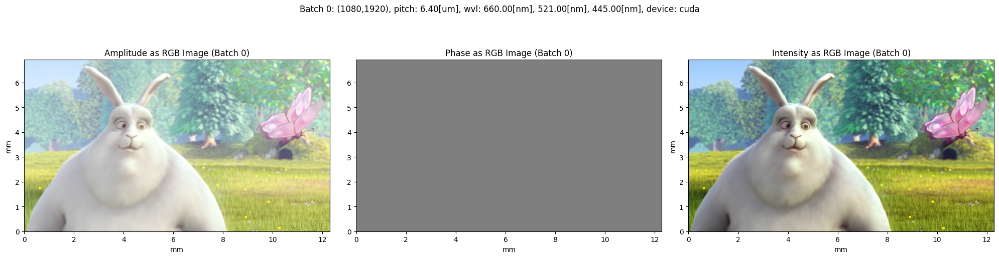

Using gerchberg saxton (GS) algorithm
Iteration 0, PSNR: 22.99
Iteration 10, PSNR: 31.63
Iteration 20, PSNR: 30.81
Iteration 30, PSNR: 30.01
Iteration 40, PSNR: 29.63
Using stochastic gradient descent (SGD) algorithm
Iteration 0, PSNR: 23.85
Iteration 10, PSNR: 32.63
Iteration 20, PSNR: 40.46
Iteration 30, PSNR: 45.78
Iteration 40, PSNR: 48.24
Using adaptive moment estimation (ADAM) algorithm
Iteration 0, PSNR: 30.73
Iteration 10, PSNR: 33.25
Iteration 20, PSNR: 37.95
Iteration 30, PSNR: 42.18
Iteration 40, PSNR: 46.54
 Original Reconstruction PSNR : 22.99444580078125 dB


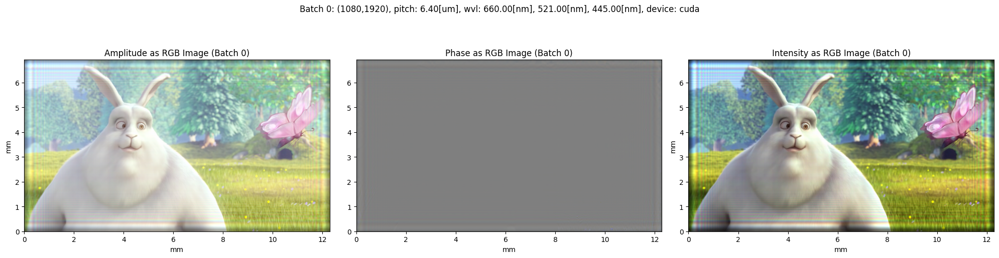

 GS Reconstruction PSNR : 29.464168548583984 dB


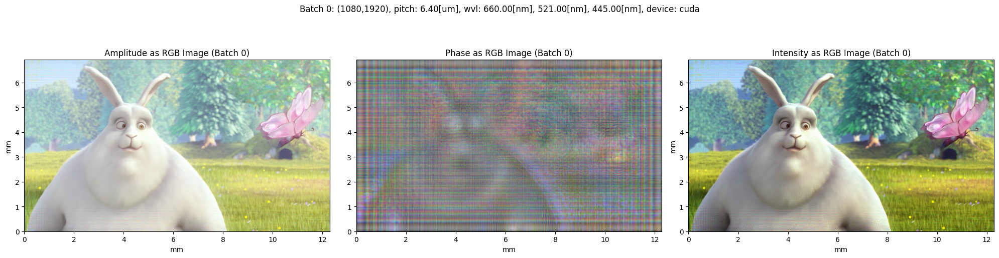

 SGD Reconstruction PSNR : 49.18680191040039 dB


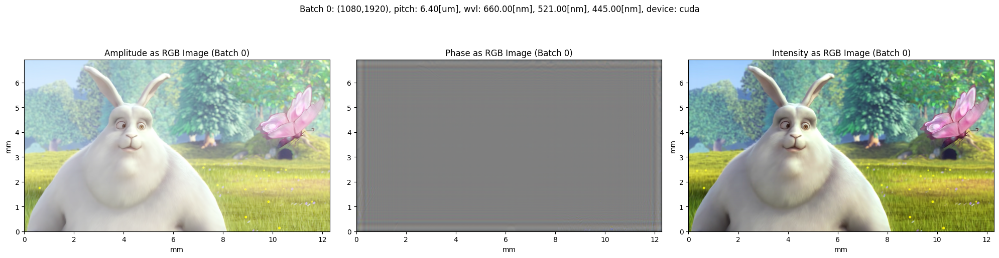

 ADAM Reconstruction PSNR : 49.51533508300781 dB


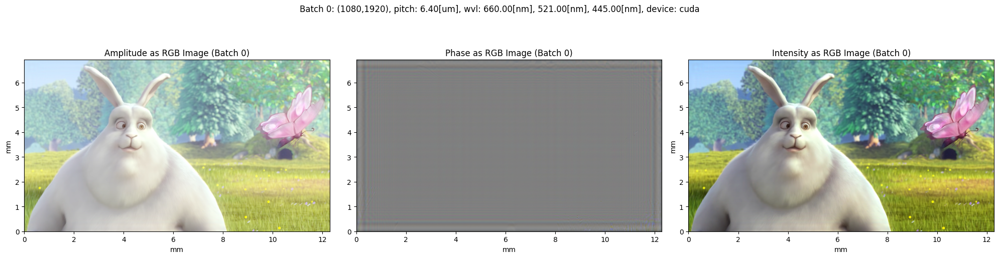

In [11]:
object_plane_indoor = pado.light.Light(dim, pitch, wvl, device=device)
object_plane_indoor.load_image(r'example\asset\bunny.PNG', random_phase=False)
object_plane_indoor.visualize_image()

# Original SLM plane
SLM_plane_indoor = prop.forward(object_plane_indoor, dist)

# Optimizing the SLM plane with indoor image
GS_optimized_indoor = GS_optimizer.optimize(SLM_plane_indoor, object_plane_indoor, dist, n_iter=50)
SGD_optimized_indoor = SGD_optimizer.optimize(SLM_plane_indoor, object_plane_indoor, dist, n_iter=50)
ADAM_optimized_indoor = ADAM_optimizer.optimize(SLM_plane_indoor, object_plane_indoor, dist, n_iter=50)

# Reconstruction of the optimized image
original_reconstruction_indoor = prop.forward(SLM_plane_indoor, -dist)
GS_reconstruction_indoor = prop.forward(GS_optimized_indoor, -dist)
SGD_reconstruction_indoor = prop.forward(SGD_optimized_indoor, -dist)
ADAM_reconstruction_indoor = prop.forward(ADAM_optimized_indoor, -dist)

# PSNR calculation and visualization
print(" Original Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane_indoor.get_intensity(), original_reconstruction_indoor.get_intensity())))
original_reconstruction_indoor.visualize_image()

print(" GS Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane_indoor.get_intensity(), GS_reconstruction_indoor.get_intensity())))
GS_reconstruction_indoor.visualize_image()

print(" SGD Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane_indoor.get_intensity(), SGD_reconstruction_indoor.get_intensity())))
SGD_reconstruction_indoor.visualize_image()

print(" ADAM Reconstruction PSNR : {} dB".format(pado.math.calculate_psnr(object_plane_indoor.get_intensity(), ADAM_reconstruction_indoor.get_intensity())))
ADAM_reconstruction_indoor.visualize_image()